# Custom Training with YOLOv5


Steps:
* Gather a dataset of images and label our dataset
* Export our dataset to YOLOv5
* Train YOLOv5 to recognize the objects in our dataset
* Evaluate our YOLOv5 model's performance
* Run test inference to view our model at work


# Step 1: Install Requirements

In [1]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 14245, done.
remote: Total 14245 (delta 0), reused 0 (delta 0), pack-reused 14245
Receiving objects: 100% (14245/14245), 13.50 MiB | 11.44 MiB/s, done.
Resolving deltas: 100% (9810/9810), done.
/content/yolov5
     |████████████████████████████████| 182 kB 23.0 MB/s 
     |████████████████████████████████| 62 kB 560 kB/s 
     |████████████████████████████████| 1.6 MB 15.7 MB/s 
     |████████████████████████████████| 41 kB 124 kB/s 
     |████████████████████████████████| 145 kB 65.1 MB/s 
     |████████████████████████████████| 54 kB 3.0 MB/s 
     |████████████████████████████████| 67 kB 6.5 MB/s 
     |████████████████████████████████| 138 kB 69.9 MB/s 
     |████████████████████████████████| 178 kB 70.4 MB/s 
     |████████████████████████████████| 62 kB 1.7 MB/s 
Setup complete. Using torch 1.12.1+cu113 (Tesla T4)


# Step 2: Assemble Our Dataset

In order to train our custom model, we need to assemble a dataset of representative images with bounding box annotations around the objects that we want to detect. And we need our dataset to be in YOLOv5 format.


We have done the annotations separately using **Labelmg**

A configuration file (dataset.yaml file) is separately put in the directory (/content/yolov5/dataset.yaml)


The train images are separately put in the images directory (/content/yolov5/data/images)

For annotations, a folder named 'labels' is made and the annotations are saved in that directory (/content/yolov5/data/labels)


# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [2]:
!python train.py --img 416 --batch 16 --epochs 150 --data dataset.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-12-g7f5724b Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, 

# Step 4: Predictions on test data

In [3]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source '/content/yolov5/data/images'

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/yolov5/data/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-12-g7f5724b Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7053277 parameters, 0 gradients, 15.9 GFLOPs
image 1/55 /content/yolov5/data/images/1.JPG: 416x416 1 disease, 8.1ms
image 2/55 /content/yolov5/data/images/10.JPG: 416x416 1 disease, 8.1ms
image 3/55 /content/yolov5/data/images/11.JPG: 416x416 1 disease, 8.1ms
image 4/55 /content/yolov5/data/images/12.JPG: 416x416 1 disease, 8.1ms
image 5/55 /content/yolov5/data/images/13.JPG: 416x41

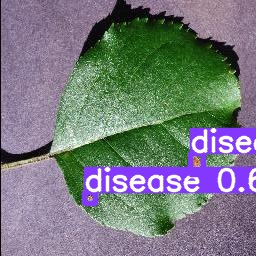

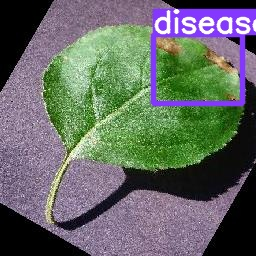

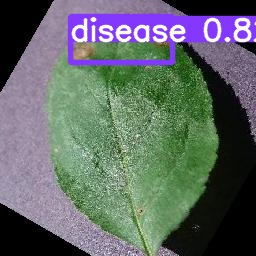

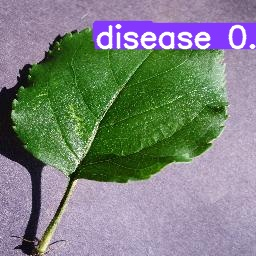

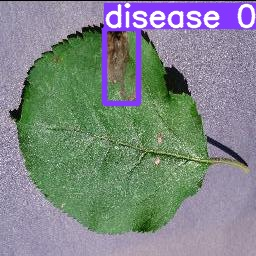

...

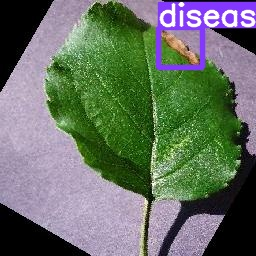

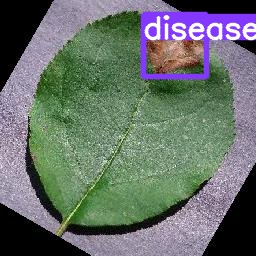

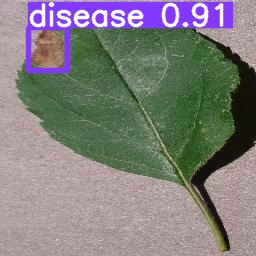

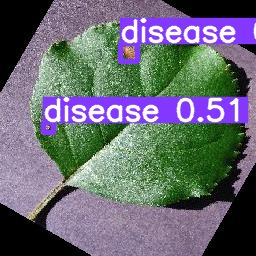

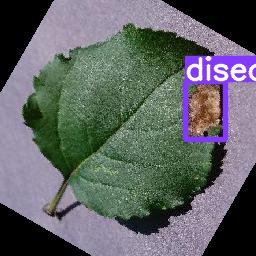

In [4]:
# plotting prediction results 

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.JPG'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Step 5: Evaluate the model


In [5]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [6]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>